# Business Data Analytics Final Year Project  
## Elevating Cinnamon Hotels & Resorts in Sri Lanka: Using Guest Reviews and Arrival Data  

### Section 1: Data Loading & Initial Inspection

In [ ]:
from google.colab import files

uploaded = files.upload()  # ← Click and select 'Bad_Reviews_Dataset.xlsx' from your computer
print("Uploaded files:", list(uploaded.keys()))

Saving Bad_Reviews_Dataset.xlsx to Bad_Reviews_Dataset (1).xlsx
Uploaded files: ['Bad_Reviews_Dataset (1).xlsx']


In [ ]:
import pandas as pd

# Load the file (filename should match exactly what you uploaded)
bad_df = pd.read_excel('Bad_Reviews_Dataset.xlsx')

print("Dataset shape (rows, columns):", bad_df.shape)
print("\nColumn names:\n", bad_df.columns.tolist())
print("\nFirst 3 rows preview:")
display(bad_df.head(3))

Dataset shape (rows, columns): (2880, 35)

Column names:
 ['ReviewDate', 'TravlerType', 'Platform', 'OwnerResponse', 'TotalReviewsbyUser', 'ValueforMoneyRating', 'FreeWifiRating', 'placeInfo/rating', 'ReviewTitle', 'CheckInDate', 'OverallRating', 'StaffRating', 'UserName', 'NumberofNights', 'CleanlinessRating', 'HotelRatingLabel', 'LocationRating', 'OwnerResponsepublishedDate', 'month_year', 'PropertyResponse', 'UserLocationinShort', 'RoomtipText', 'TripType', 'HotelRating', 'FacilitiesRating', 'ReviewLanguage', 'review_text', 'UserLocation', 'ComfortRating', 'DislikedText', 'RatingPublishedPlatform', 'SleepQualityRating', 'LikedText', 'CheckOutDate', 'Hotel/Resort']

First 3 rows preview:


,ReviewDate,TravlerType,Platform,OwnerResponse,TotalReviewsbyUser,ValueforMoneyRating,FreeWifiRating,placeInfo/rating,ReviewTitle,CheckInDate,...,ReviewLanguage,review_text,UserLocation,ComfortRating,DislikedText,RatingPublishedPlatform,SleepQualityRating,LikedText,CheckOutDate,Hotel/Resort
0,2025-11-06 10:55:18,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,Bad experience,2025-10-31,...,xu,No thing Different room provided reception ver...,Qatar,4.3,Different room provided reception very bad and...,NaN,NaN,No thing,2025-11-02,Cinnamon Citadel Kandy
1,2025-10-31 09:30:45,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,NaN,2025-10-15,...,xu,It’s big and beautiful in general \nHe has eve...,Chile,4.3,My room was with mosquitoes that didn’t let me...,NaN,NaN,It’s big and beautiful in general \nHe has eve...,2025-10-17,Cinnamon Citadel Kandy
2,2025-10-24 13:43:42,Family,Booking.com,NaN,NaN,4.0,4.1,NaN,NaN,2025-10-19,...,en,relaxed room setup with garden view and reclin...,Sri Lanka,4.3,the limited food options in the buffet for din...,NaN,NaN,relaxed room setup with garden view and reclin...,2025-10-20,Cinnamon Citadel Kandy


In [ ]:
print("Data types:\n", bad_df.dtypes)
print("\nMissing values per column (sorted descending):\n")
display(bad_df.isnull().sum().sort_values(ascending=False).to_frame(name='Missing Count').head(15))

Data types:
 ReviewDate                    datetime64[ns]
TravlerType                           object
Platform                              object
OwnerResponse                         object
TotalReviewsbyUser                   float64
ValueforMoneyRating                  float64
FreeWifiRating                       float64
placeInfo/rating                     float64
ReviewTitle                           object
CheckInDate                   datetime64[ns]
OverallRating                        float64
StaffRating                          float64
UserName                              object
NumberofNights                       float64
CleanlinessRating                    float64
HotelRatingLabel                      object
LocationRating                       float64
OwnerResponsepublishedDate    datetime64[ns]
month_year                            object
PropertyResponse                      object
UserLocationinShort                   object
RoomtipText                           obje

,Missing Count
SleepQualityRating,2269
PropertyResponse,2101
DislikedText,2080
UserLocationinShort,1822
CheckOutDate,1687
ReviewDate,1687
TravlerType,1687
FreeWifiRating,1687
CheckInDate,1687
HotelRatingLabel,1687


In [ ]:
# Numeric columns (ratings + any numeric-like)
numeric_cols = bad_df.select_dtypes(include=['number', 'datetime']).columns.tolist()
print("Numeric columns found:", numeric_cols)
print("\nDescriptive statistics for numeric columns:\n")
display(bad_df[numeric_cols].describe().round(2))

Numeric columns found: ['ReviewDate', 'TotalReviewsbyUser', 'ValueforMoneyRating', 'FreeWifiRating', 'placeInfo/rating', 'CheckInDate', 'OverallRating', 'StaffRating', 'NumberofNights', 'CleanlinessRating', 'LocationRating', 'OwnerResponsepublishedDate', 'HotelRating', 'FacilitiesRating', 'ComfortRating', 'SleepQualityRating', 'CheckOutDate']

Descriptive statistics for numeric columns:



,ReviewDate,TotalReviewsbyUser,ValueforMoneyRating,FreeWifiRating,placeInfo/rating,CheckInDate,OverallRating,StaffRating,NumberofNights,CleanlinessRating,LocationRating,OwnerResponsepublishedDate,HotelRating,FacilitiesRating,ComfortRating,SleepQualityRating,CheckOutDate
count,1193,1686.00,1875.00,1193.00,1687.00,1193,2880.00,2119.00,1193.00,1783.00,1883.00,1546,2880.00,1193.00,1829.00,611.00,1193
mean,2024-09-09 04:38:48.569991680,114.58,3.52,4.27,4.44,2024-08-29 15:58:23.436714240,2.27,3.75,1.96,4.06,4.28,2021-07-29 16:33:50.530401024,2.27,4.34,3.90,3.25,2024-08-31 15:04:04.425817088
min,2022-11-27 10:14:09,1.00,1.00,4.10,4.30,2022-11-03 00:00:00,0.50,1.00,1.00,1.00,1.00,2014-07-12 00:00:00,0.50,4.20,1.00,1.00,2022-11-05 00:00:00
25%,2023-12-31 03:32:49,2.00,3.00,4.10,4.30,2023-12-24 00:00:00,2.00,3.00,1.00,4.00,4.20,2018-05-15 00:00:00,2.00,4.20,3.00,2.00,2023-12-26 00:00:00
50%,2024-12-19 11:10:14,15.00,4.00,4.20,4.40,2024-12-09 00:00:00,2.50,4.40,1.00,4.40,4.50,2023-01-12 00:00:00,2.50,4.40,4.30,3.00,2024-12-12 00:00:00
75%,2025-06-11 08:37:02,60.00,4.20,4.40,4.50,2025-05-31 00:00:00,3.00,4.50,2.00,4.50,4.70,2024-09-02 00:00:00,3.00,4.40,4.60,4.00,2025-06-01 00:00:00
max,2025-12-02 17:17:10,18278.00,5.00,4.50,4.80,2025-11-28 00:00:00,3.00,5.00,17.00,5.00,5.00,2025-12-25 00:00:00,3.00,4.70,5.00,5.00,2025-11-29 00:00:00
std,NaN,749.45,1.01,0.16,0.16,NaN,0.84,1.18,1.58,0.88,0.73,NaN,0.84,0.14,1.06,1.23,NaN


In [ ]:
print("=== First 8 rows ===")
display(bad_df.head(8))

print("\n=== Random 5 rows ===")
display(bad_df.sample(5, random_state=42))

print("\n=== Last 5 rows ===")
display(bad_df.tail(5))

=== First 8 rows ===


,ReviewDate,TravlerType,Platform,OwnerResponse,TotalReviewsbyUser,ValueforMoneyRating,FreeWifiRating,placeInfo/rating,ReviewTitle,CheckInDate,...,ReviewLanguage,review_text,UserLocation,ComfortRating,DislikedText,RatingPublishedPlatform,SleepQualityRating,LikedText,CheckOutDate,Hotel/Resort
0,2025-11-06 10:55:18,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,Bad experience,2025-10-31,...,xu,No thing Different room provided reception ver...,Qatar,4.3,Different room provided reception very bad and...,NaN,NaN,No thing,2025-11-02,Cinnamon Citadel Kandy
1,2025-10-31 09:30:45,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,NaN,2025-10-15,...,xu,It’s big and beautiful in general \nHe has eve...,Chile,4.3,My room was with mosquitoes that didn’t let me...,NaN,NaN,It’s big and beautiful in general \nHe has eve...,2025-10-17,Cinnamon Citadel Kandy
2,2025-10-24 13:43:42,Family,Booking.com,NaN,NaN,4.0,4.1,NaN,NaN,2025-10-19,...,en,relaxed room setup with garden view and reclin...,Sri Lanka,4.3,the limited food options in the buffet for din...,NaN,NaN,relaxed room setup with garden view and reclin...,2025-10-20,Cinnamon Citadel Kandy
3,2025-10-22 14:51:52,Family,Booking.com,NaN,NaN,4.0,4.1,NaN,It was very ok,2025-10-15,...,en,It’s decently large but the water retention on...,India,4.3,We have asked the staff to help us with snorkl...,NaN,NaN,It’s decently large but the water retention on...,2025-10-18,Cinnamon Citadel Kandy
4,2025-10-17 16:05:06,Family,Booking.com,NaN,NaN,4.0,4.1,NaN,Nice hotel with the worst check-in experience.,2025-10-16,...,en,"The property is huge, the buffet spread is ver...",India,4.3,Check in staff especially the person who was d...,NaN,NaN,"The property is huge, the buffet spread is ver...",2025-10-17,Cinnamon Citadel Kandy
5,2025-10-11 14:58:29,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,Wouldn’t Recommend for a Peaceful Stay & Do no...,2025-10-10,...,en,The staff were genuinely wonderful — from the ...,Russia,4.3,The hotel’s “all-inclusive” offer is extremely...,NaN,NaN,The staff were genuinely wonderful — from the ...,2025-10-11,Cinnamon Citadel Kandy
6,2025-09-22 15:50:30,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,The stay was good,2025-09-21,...,en,Location and the ambience were good. But the f...,Sri Lanka,4.3,There were flies in the room. There were some ...,NaN,NaN,Location and the ambience were good. But the f...,2025-09-22,Cinnamon Citadel Kandy
7,2025-09-10 13:26:03,Couple,Booking.com,NaN,NaN,4.0,4.1,NaN,Average,2025-09-05,...,xu,Location and breakfast were great. Most of the...,Sri Lanka,4.3,Parking and room service were very poor. City ...,NaN,NaN,Location and breakfast were great. Most of the...,2025-09-06,Cinnamon Citadel Kandy



=== Random 5 rows ===


,ReviewDate,TravlerType,Platform,OwnerResponse,TotalReviewsbyUser,ValueforMoneyRating,FreeWifiRating,placeInfo/rating,ReviewTitle,CheckInDate,...,ReviewLanguage,review_text,UserLocation,ComfortRating,DislikedText,RatingPublishedPlatform,SleepQualityRating,LikedText,CheckOutDate,Hotel/Resort
471,2023-09-06 02:44:01,Couple,Booking.com,NaN,NaN,4.2,4.4,NaN,Buffay was great. Customer service was good in...,2023-09-03,...,xu,"Property was beautiful very relaxing. However,...",United States,4.6,They need to clean the room’s need more cleani...,NaN,NaN,"Property was beautiful very relaxing. However,...",2023-09-04,Trinco Blu by Cinnamon
1453,NaT,NaN,TripAdvisor,"Dear Guest,\n\nThank you for taking the time t...",1.0,3.0,NaN,4.7,Can do better need to tweak,NaT,...,en,The breakfast and dinner spread is hige but in...,"Gulbarga, India",3.0,NaN,OTHER,3.0,The breakfast and dinner spread is hige but in...,NaT,Cinnamon Red Colombo
2377,NaT,NaN,TripAdvisor,NaN,679.0,NaN,NaN,4.5,immerso nella natura,NaT,...,it,hotel isolato dai centri abitati. struttura be...,"Naples, Italy",NaN,NaN,MOBILE,NaN,hotel isolato dai centri abitati. struttura be...,NaT,Cinnamon Citadel Kandy
1601,NaT,NaN,TripAdvisor,"Dear Guest,\n\nThank you for sharing your feed...",1.0,NaN,NaN,4.5,Остерегайтесь этих мошенников.,NaT,...,ru,После 24-часового перелета мы предоставили оте...,NaN,NaN,NaN,OTHER,NaN,После 24-часового перелета мы предоставили оте...,NaT,Cinnamon Bey Beruwala
1094,2023-11-20 00:38:29,Family,Booking.com,NaN,NaN,4.0,4.2,NaN,NaN,2023-10-22,...,en,NaN,Sri Lanka,4.3,NaN,NaN,NaN,NaN,2023-10-23,Cinnamon Lodge Habarana



=== Last 5 rows ===


,ReviewDate,TravlerType,Platform,OwnerResponse,TotalReviewsbyUser,ValueforMoneyRating,FreeWifiRating,placeInfo/rating,ReviewTitle,CheckInDate,...,ReviewLanguage,review_text,UserLocation,ComfortRating,DislikedText,RatingPublishedPlatform,SleepQualityRating,LikedText,CheckOutDate,Hotel/Resort
2875,NaT,NaN,TripAdvisor,Thank you for sharing your experiences of Blu\...,35.0,2.0,NaN,4.3,A eviter sauf pour le restaurant!!!,NaT,...,fr,LE chaaya blu est un hotel qui a mal vieilli.....,NaN,NaN,NaN,OTHER,NaN,LE chaaya blu est un hotel qui a mal vieilli.....,NaT,Trinco Blu by Cinnamon
2876,NaT,NaN,TripAdvisor,Thank you for visiting us and sharing your exp...,37.0,2.0,NaN,4.3,Disappointed,NaT,...,en,"The whole area, including the garden smelt of ...","Evans, Georgia",NaN,NaN,OTHER,NaN,"The whole area, including the garden smelt of ...",NaT,Trinco Blu by Cinnamon
2877,NaT,NaN,TripAdvisor,Thank you for sharing your experience during y...,11.0,NaN,NaN,4.3,Double denim decor!,NaT,...,en,Comfortable stay. The rooms are basic and clea...,NaN,NaN,NaN,MOBILE,NaN,Comfortable stay. The rooms are basic and clea...,NaT,Trinco Blu by Cinnamon
2878,NaT,NaN,TripAdvisor,Thank you for choosing to stay at Blu during y...,103.0,NaN,NaN,4.3,"Nice setting, great breakfast, nice pool but s...",NaT,...,en,This is a nice resort style property on the be...,NaN,3.0,NaN,OTHER,4.0,This is a nice resort style property on the be...,NaT,Trinco Blu by Cinnamon
2879,NaT,NaN,TripAdvisor,Thank you for taking time for sharing your exp...,364.0,NaN,NaN,4.3,Ok for tourists,NaT,...,en,Hates this place though tourists obviously fou...,NaN,NaN,NaN,OTHER,5.0,Hates this place though tourists obviously fou...,NaT,Trinco Blu by Cinnamon


In [ ]:
# Only use columns that are guaranteed to exist in raw data
safe_cols = ['Hotel/Resort', 'TravlerType', 'OverallRating']  # add any other you know exist

print("Unique value counts for key columns:")
for col in safe_cols:
    if col in bad_df.columns:
        print(f"\n{col}: {bad_df[col].nunique()} unique values")
        print(bad_df[col].value_counts().head(10))
    else:
        print(f"Column '{col}' not found in raw data yet.")

# If 'UserLocationinShort' exists → preview it (will become 'Country' later)
if 'UserLocationinShort' in bad_df.columns:
    print("\nUserLocationinShort (short country codes) top 10:\n", bad_df['UserLocationinShort'].value_counts().head(10))

Unique value counts for key columns:

Hotel/Resort: 12 unique values
Hotel/Resort
Cinnamon Bey Beruwala           425
Cinnamon Lodge Habarana         415
Trinco Blu by Cinnamon          375
Cinnamon Citadel Kandy          319
Hikka Tranz by Cinnamon         315
Cinnamon Grand Colombo          224
Cinnamon Wild Yala              198
Cinnamon Lakeside Colombo       163
Habarana Village by Cinnamon    161
Cinnamon Red Colombo            107
Name: count, dtype: int64

TravlerType: 4 unique values
TravlerType
Family           473
Couple           390
Group            165
Solo traveler    165
Name: count, dtype: int64

OverallRating: 6 unique values
OverallRating
3.0    1358
2.0     531
1.0     418
2.5     311
0.5     175
1.5      87
Name: count, dtype: int64

UserLocationinShort (short country codes) top 10:
 UserLocationinShort
Colombo      156
London        68
Melbourne     30
Dubai         23
Paris         17
Singapore     15
Moscow        14
Kandy         14
Sydney        13
Mumbai     

In [ ]:
print("Quick observations after loading:")
print("• Shape:", bad_df.shape)
print("• Columns with high missing values:", bad_df.columns[bad_df.isnull().mean() > 0.3].tolist())
print("• Likely text columns:", [c for c in bad_df.columns if bad_df[c].dtype == 'object'][:8])
print("• Likely rating columns:", [c for c in bad_df.columns if 'Rating' in c])
print("• Date columns likely:", [c for c in bad_df.columns if 'Date' in c])
print("\nReady for cleaning → next section will handle nulls, dates, text, and create 'Country'.")

Quick observations after loading:
• Shape: (2880, 35)
• Columns with high missing values: ['ReviewDate', 'TravlerType', 'OwnerResponse', 'TotalReviewsbyUser', 'ValueforMoneyRating', 'FreeWifiRating', 'placeInfo/rating', 'CheckInDate', 'NumberofNights', 'CleanlinessRating', 'HotelRatingLabel', 'LocationRating', 'OwnerResponsepublishedDate', 'PropertyResponse', 'UserLocationinShort', 'RoomtipText', 'TripType', 'FacilitiesRating', 'ComfortRating', 'DislikedText', 'RatingPublishedPlatform', 'SleepQualityRating', 'CheckOutDate']
• Likely text columns: ['TravlerType', 'Platform', 'OwnerResponse', 'ReviewTitle', 'UserName', 'HotelRatingLabel', 'month_year', 'PropertyResponse']
• Likely rating columns: ['ValueforMoneyRating', 'FreeWifiRating', 'OverallRating', 'StaffRating', 'CleanlinessRating', 'HotelRatingLabel', 'LocationRating', 'HotelRating', 'FacilitiesRating', 'ComfortRating', 'RatingPublishedPlatform', 'SleepQualityRating']
• Date columns likely: ['ReviewDate', 'CheckInDate', 'OwnerRes

### 2. Data Cleaning & Preparation


In [ ]:
# Install required packages for language detection and other tools
!pip install langdetect -q
!pip install wordcloud pyLDAvis sentence-transformers -q  # Optional: for later sections (wordcloud, topics, BERT)

print("Installation complete. You can now import langdetect.")

Installation complete. You can now import langdetect.


In [ ]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
from langdetect import detect, LangDetectException
import pandas as pd
import nltk
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)
print("Imports complete – langdetect now available.")

Imports complete – langdetect now available.


In [ ]:
# Text columns – fill missing with empty string
text_cols = ['review_text', 'DislikedText', 'LikedText', 'ReviewTitle', 'OwnerResponse', 'PropertyResponse']
for col in text_cols:
    if col in bad_df.columns:
        bad_df[col] = bad_df[col].fillna('').astype(str)
    else:
        print(f"Warning: Column '{col}' not found in dataset.")

# Rating columns – convert to numeric, fill with median
rating_cols = ['OverallRating', 'StaffRating', 'CleanlinessRating', 'LocationRating',
               'FacilitiesRating', 'ComfortRating', 'ValueforMoneyRating', 'FreeWifiRating']

for col in rating_cols:
    if col in bad_df.columns:
        bad_df[col] = pd.to_numeric(bad_df[col], errors='coerce')
        bad_df[col] = bad_df[col].fillna(bad_df[col].median())  # Median for robustness

print("Null handling completed.")
print("\nRating columns after cleaning:\n")
display(bad_df[rating_cols].describe().round(2) if rating_cols else "No rating columns found.")

Null handling completed.

Rating columns after cleaning:



,OverallRating,StaffRating,CleanlinessRating,LocationRating,FacilitiesRating,ComfortRating,ValueforMoneyRating,FreeWifiRating
count,2880.00,2880.00,2880.00,2880.00,2880.00,2880.00,2880.00,2880.00
mean,2.27,3.92,4.19,4.36,4.37,4.04,3.69,4.23
std,0.84,1.05,0.71,0.60,0.09,0.86,0.85,0.11
min,0.50,1.00,1.00,1.00,4.20,1.00,1.00,4.10
25%,2.00,4.00,4.30,4.40,4.40,4.30,3.90,4.20
50%,2.50,4.40,4.40,4.50,4.40,4.30,4.00,4.20
75%,3.00,4.40,4.50,4.60,4.40,4.50,4.00,4.20
max,3.00,5.00,5.00,5.00,4.70,5.00,5.00,4.50


In [ ]:
date_cols = ['ReviewDate', 'CheckInDate', 'CheckOutDate', 'OwnerResponsepublishedDate']

for col in date_cols:
    if col in bad_df.columns:
        bad_df[col] = pd.to_datetime(bad_df[col], errors='coerce')
    else:
        print(f"Warning: Date column '{col}' not found.")

# Derived features
if all(c in bad_df.columns for c in ['CheckOutDate', 'CheckInDate']):
    bad_df['stay_duration_days'] = (bad_df['CheckOutDate'] - bad_df['CheckInDate']).dt.days.fillna(0).astype(int)
else:
    bad_df['stay_duration_days'] = 0

if 'ReviewDate' in bad_df.columns:
    bad_df['month_year'] = bad_df['ReviewDate'].dt.to_period('M').astype(str)
    bad_df['quarter'] = bad_df['ReviewDate'].dt.to_period('Q').astype(str)
    bad_df['year'] = bad_df['ReviewDate'].dt.year.astype('Int64')

print("Date features added.")
print("Average stay duration:", bad_df.get('stay_duration_days', pd.Series([0])).mean().round(1), "days")
print("Unique months in data:", bad_df.get('month_year', pd.Series()).nunique())

display_cols = [c for c in date_cols + ['stay_duration_days', 'month_year', 'quarter', 'year'] if c in bad_df.columns]
display(bad_df[display_cols].head(8))

Date features added.
Average stay duration: 0.8 days
Unique months in data: 39


,ReviewDate,CheckInDate,CheckOutDate,OwnerResponsepublishedDate,stay_duration_days,month_year,quarter,year
0,2025-11-06 10:55:18,2025-10-31,2025-11-02,NaT,2,2025-11,2025Q4,2025
1,2025-10-31 09:30:45,2025-10-15,2025-10-17,NaT,2,2025-10,2025Q4,2025
2,2025-10-24 13:43:42,2025-10-19,2025-10-20,NaT,1,2025-10,2025Q4,2025
3,2025-10-22 14:51:52,2025-10-15,2025-10-18,NaT,3,2025-10,2025Q4,2025
4,2025-10-17 16:05:06,2025-10-16,2025-10-17,NaT,1,2025-10,2025Q4,2025
5,2025-10-11 14:58:29,2025-10-10,2025-10-11,NaT,1,2025-10,2025Q4,2025
6,2025-09-22 15:50:30,2025-09-21,2025-09-22,NaT,1,2025-09,2025Q3,2025
7,2025-09-10 13:26:03,2025-09-05,2025-09-06,NaT,1,2025-09,2025Q3,2025


In [ ]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def advanced_clean_text(text):
    text = str(text).lower().strip()
    # Remove URLs, numbers, punctuation
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    # Lemmatize & remove stopwords/short words
    words = [lemmatizer.lemmatize(w) for w in text.split() if w not in stop_words and len(w) > 2]
    return ' '.join(words)

# Combine relevant text fields
text_fields = [f for f in ['review_text', 'DislikedText', 'LikedText'] if f in bad_df.columns]
if text_fields:
    combined_text = bad_df[text_fields].fillna('').astype(str).agg(' '.join, axis=1)
    bad_df['clean_text'] = combined_text.apply(advanced_clean_text)
else:
    bad_df['clean_text'] = ''

print("Text cleaning completed.")
length_comparison = bad_df[['clean_text']].copy()
length_comparison['original_length'] = bad_df[text_fields[0]] if text_fields else 0
length_comparison['clean_length'] = bad_df['clean_text'].str.len()
print("\nText length stats:\n", length_comparison.describe().round(1))
display(bad_df[['clean_text']].head(8))

Text cleaning completed.

Text length stats:
        clean_length
count        2880.0
mean          698.0
std           825.3
min             0.0
25%           210.5
50%           451.0
75%           882.0
max         13661.0


,clean_text
0,thing different room provided reception bad pr...
1,big beautiful general everything room mosquito...
2,relaxed room setup garden view reclined chair ...
3,decently large water retention floor super ann...
4,property huge buffet spread nice location supe...
5,staff genuinely wonderful reception bar restau...
6,location ambience good food best expected fly ...
7,location breakfast great staff friendly helpfu...


In [ ]:
def is_english_safe(text):
    text = str(text).strip()
    if len(text) < 20 or len(text.split()) < 5:
        return False
    try:
        return detect(text) == 'en'
    except LangDetectException:
        return False

# Create English-only subset
bad_df_en = bad_df[bad_df['clean_text'].apply(is_english_safe)].copy()

# Remove very short or empty cleaned reviews
bad_df_en = bad_df_en[bad_df_en['clean_text'].str.len() > 30]

print("English filtering done.")
print(f"Original rows: {bad_df.shape[0]}")
print(f"English rows: {bad_df_en.shape[0]}")
print(f"Removed: {bad_df.shape[0] - bad_df_en.shape[0]} rows")
print("\nSample cleaned English reviews:")
display(bad_df_en['clean_text'].sample(8, random_state=42))

English filtering done.
Original rows: 2880
English rows: 2022
Removed: 858 rows

Sample cleaned English reviews:


,clean_text
1297,hotel disappointing stayed number hotel throug...
2088,interesting arrive hotel reading recent review...
1347,stayed one night catching plane thought first ...
1152,food great thought match cinnamon standard hot...
1138,awful service room small staff could polite aw...
1962,dinner staff aug rude would even give finger b...
248,location cleanliness restaurant staff attitude...
2179,wonderful hotel beautiful landscapefood variti...


In [ ]:
# Create 'Country' column from 'UserLocationinShort'
if 'UserLocationinShort' in bad_df_en.columns:
    bad_df_en['Country'] = bad_df_en['UserLocationinShort'].astype(str).str.upper().str.strip()

    # Basic mapping (expand if you see more codes in your data)
    country_mapping = {
        'UK': 'UNITED KINGDOM',
        'US': 'UNITED STATES',
        'USA': 'UNITED STATES',
        'AU': 'AUSTRALIA',
        'SL': 'SRI LANKA',
        'IND': 'INDIA',
        'DE': 'GERMANY',
        'FR': 'FRANCE'
    }
    bad_df_en['Country'] = bad_df_en['Country'].replace(country_mapping).fillna('UNKNOWN')
else:
    bad_df_en['Country'] = 'UNKNOWN'

# Standardize traveler type
if 'TravlerType' in bad_df_en.columns:
    bad_df_en['TravlerType'] = bad_df_en['TravlerType'].astype(str).str.title().str.strip().fillna('Unknown')

print("Country & TravelerType standardized.")
print("\nTop 12 Countries:\n", bad_df_en['Country'].value_counts().head(12))
print("\nTraveler Types:\n", bad_df_en['TravlerType'].value_counts().head(10))

Country & TravelerType standardized.

Top 12 Countries:
 Country
NAN          1132
COLOMBO       156
LONDON         68
MELBOURNE      30
DUBAI          23
SINGAPORE      14
KANDY          14
SYDNEY         13
BENGALURU      10
SRI LANKA      10
MUMBAI         10
PARIS           9
Name: count, dtype: int64

Traveler Types:
 TravlerType
Nan              1424
Family            252
Couple            179
Solo Traveler      89
Group              78
Name: count, dtype: int64


### 3. Exploratory Data Analysis (Poster Step 03)


In [ ]:
!pip install wordcloud -q
print("WordCloud ready.")

WordCloud ready.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from collections import Counter
from wordcloud import WordCloud
import numpy as np
sns.set(style="whitegrid")
print("EDA libraries imported.")

EDA libraries imported.


In [ ]:
print("Rating columns found:", rating_cols)
print("\nDescriptive stats (mean, std, min, max):\n")
display(bad_df_en[rating_cols].describe().round(2).T)

print("\nSkewness:\n", bad_df_en[rating_cols].skew().round(2))
print("\nKurtosis:\n", bad_df_en[rating_cols].kurtosis().round(2))

Rating columns found: ['OverallRating', 'StaffRating', 'CleanlinessRating', 'LocationRating', 'FacilitiesRating', 'ComfortRating', 'ValueforMoneyRating', 'FreeWifiRating']

Descriptive stats (mean, std, min, max):



,count,mean,std,min,25%,50%,75%,max
OverallRating,2022.0,2.26,0.84,0.5,2.00,2.5,3.0,3.0
StaffRating,2022.0,3.78,1.15,1.0,3.00,4.4,4.4,5.0
CleanlinessRating,2022.0,4.13,0.78,1.0,4.30,4.4,4.4,5.0
LocationRating,2022.0,4.33,0.64,1.0,4.40,4.5,4.5,5.0
FacilitiesRating,2022.0,4.38,0.08,4.2,4.40,4.4,4.4,4.7
ComfortRating,2022.0,3.93,0.95,1.0,4.00,4.3,4.3,5.0
ValueforMoneyRating,2022.0,3.59,0.91,1.0,3.22,4.0,4.0,5.0
FreeWifiRating,2022.0,4.22,0.09,4.1,4.20,4.2,4.2,4.5



Skewness:
 OverallRating         -0.71
StaffRating           -1.45
CleanlinessRating     -2.52
LocationRating        -2.78
FacilitiesRating      -0.59
ComfortRating         -1.94
ValueforMoneyRating   -1.76
FreeWifiRating         2.18
dtype: float64

Kurtosis:
 OverallRating         -0.94
StaffRating            0.79
CleanlinessRating      6.20
LocationRating         9.29
FacilitiesRating       4.33
ComfortRating          2.82
ValueforMoneyRating    2.08
FreeWifiRating         4.76
dtype: float64


In [ ]:
print("Top 10 hotels by review count:\n")
display(bad_df_en['Hotel/Resort'].value_counts().head(10))

print("\nBottom 5 hotels:\n")
display(bad_df_en['Hotel/Resort'].value_counts().tail(5))

print("\nTop 15 countries:\n")
display(bad_df_en['Country'].value_counts().head(15))

print("\nTraveler types:\n")
display(bad_df_en['TravlerType'].value_counts())

Top 10 hotels by review count:



,count
Hotel/Resort,
Cinnamon Lodge Habarana,307
Cinnamon Bey Beruwala,294
Trinco Blu by Cinnamon,292
Cinnamon Citadel Kandy,232
Hikka Tranz by Cinnamon,212
Cinnamon Grand Colombo,150
Cinnamon Wild Yala,143
Cinnamon Lakeside Colombo,106
Cinnamon Red Colombo,96



Bottom 5 hotels:



,count
Hotel/Resort,
Cinnamon Lakeside Colombo,106
Cinnamon Red Colombo,96
Habarana Village by Cinnamon,75
Kandy Mist by Cinnamon,58
Cinnamon Life Colombo,57



Top 15 countries:



,count
Country,
NAN,1132
COLOMBO,156
LONDON,68
MELBOURNE,30
DUBAI,23
SINGAPORE,14
KANDY,14
SYDNEY,13
BENGALURU,10



Traveler types:



,count
TravlerType,
Nan,1424
Family,252
Couple,179
Solo Traveler,89
Group,78


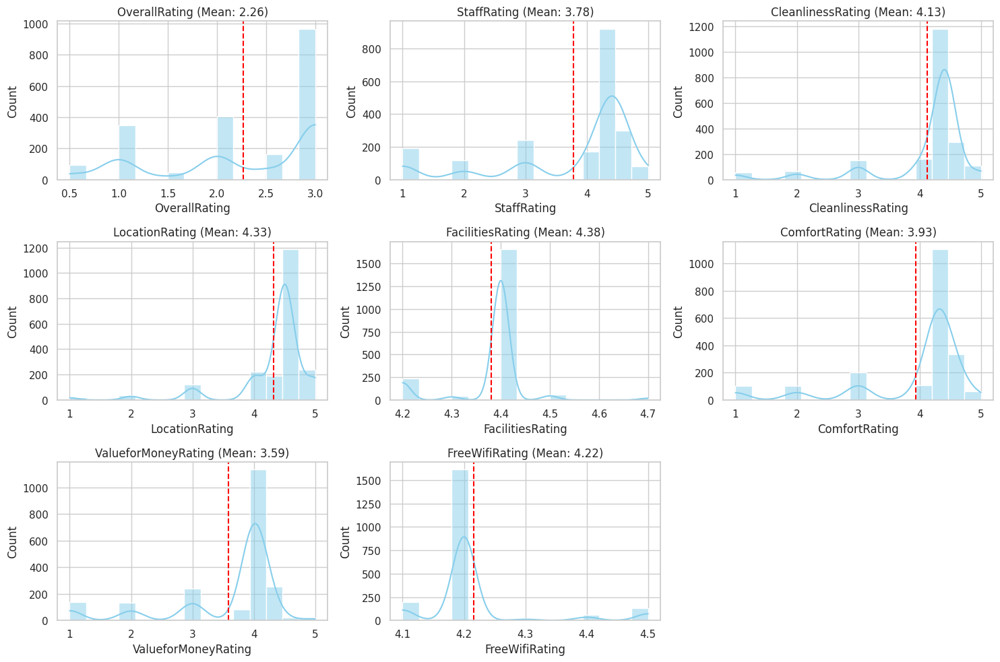

In [ ]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(rating_cols, 1):
    plt.subplot(3, 3, i)
    sns.histplot(bad_df_en[col], bins=15, kde=True, color='skyblue')
    plt.title(f'{col} (Mean: {bad_df_en[col].mean():.2f})')
    plt.axvline(bad_df_en[col].mean(), color='red', linestyle='--')
plt.tight_layout()
plt.savefig('rating_histograms.png')
plt.show()

/tmp/ipython-input-3819887241.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Hotel/Resort', y='OverallRating', data=bad_df_en, palette='Set3')


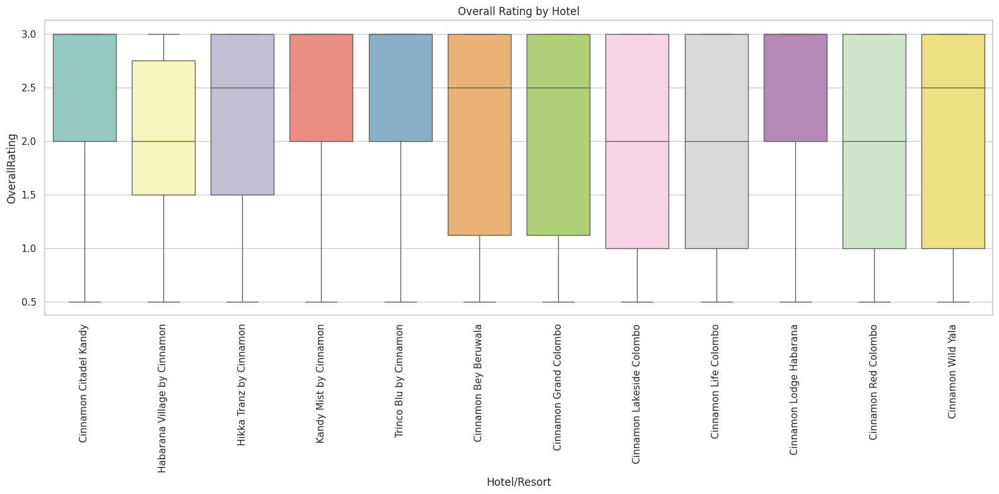

In [ ]:
plt.figure(figsize=(16, 8))
sns.boxplot(x='Hotel/Resort', y='OverallRating', data=bad_df_en, palette='Set3')
plt.xticks(rotation=90)
plt.title('Overall Rating by Hotel')
plt.tight_layout()
plt.savefig('boxplot_hotel_overall.png')
plt.show()

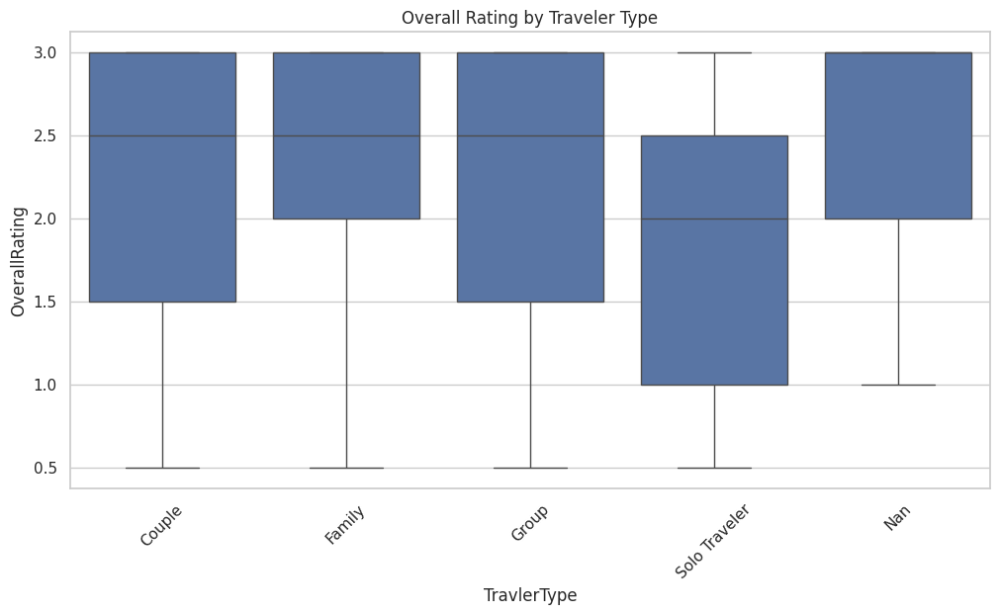

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='TravlerType', y='OverallRating', data=bad_df_en)
plt.xticks(rotation=45)
plt.title('Overall Rating by Traveler Type')
plt.savefig('boxplot_traveler_overall.png')
plt.show()

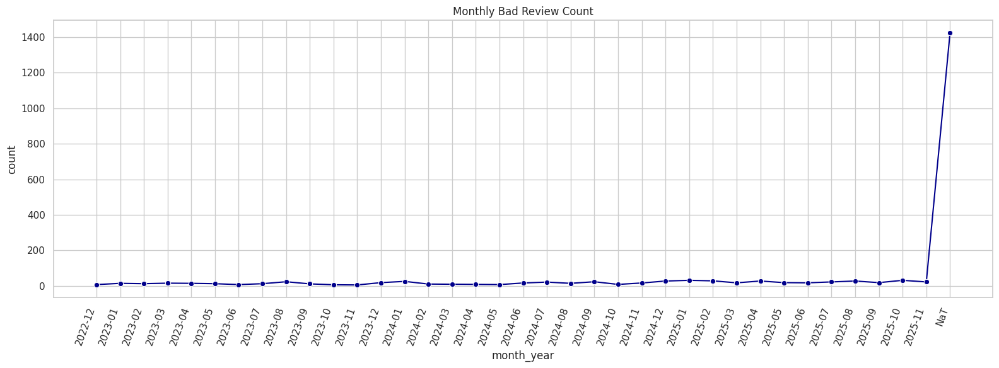

In [ ]:
monthly_count = bad_df_en.groupby('month_year').size().reset_index(name='count')
plt.figure(figsize=(16, 6))
sns.lineplot(data=monthly_count, x='month_year', y='count', marker='o', color='darkblue')
plt.title('Monthly Bad Review Count')
plt.xticks(rotation=70, ha='right')
plt.tight_layout()
plt.savefig('monthly_count_trend.png')
plt.show()

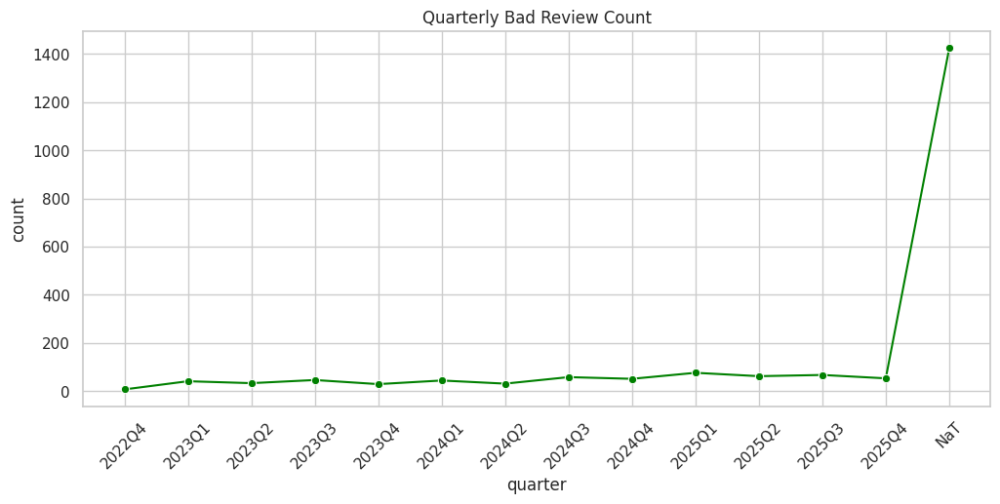

In [ ]:
quarter_count = bad_df_en.groupby('quarter').size().reset_index(name='count')
plt.figure(figsize=(12, 5))
sns.lineplot(data=quarter_count, x='quarter', y='count', marker='o', color='green')
plt.title('Quarterly Bad Review Count')
plt.xticks(rotation=45)
plt.savefig('quarterly_count_trend.png')
plt.show()

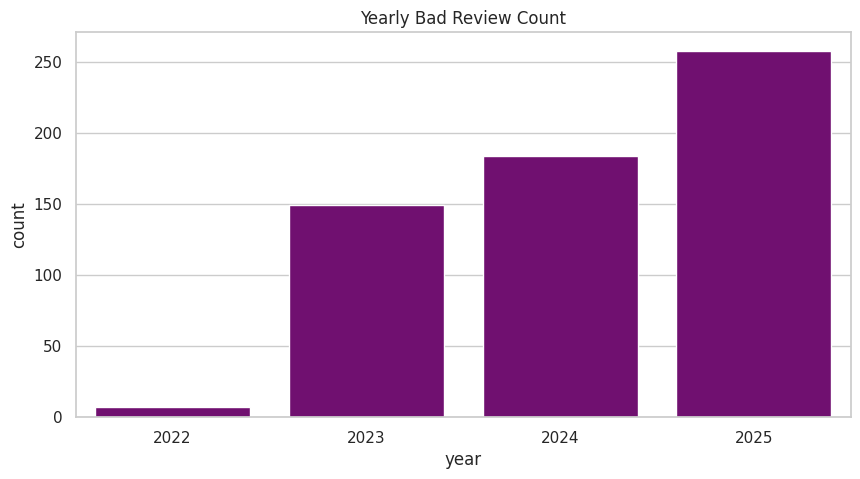

In [ ]:
year_count = bad_df_en.groupby('year').size().reset_index(name='count')
plt.figure(figsize=(10, 5))
sns.barplot(data=year_count, x='year', y='count', color='purple')
plt.title('Yearly Bad Review Count')
plt.savefig('yearly_count_bar.png')
plt.show()

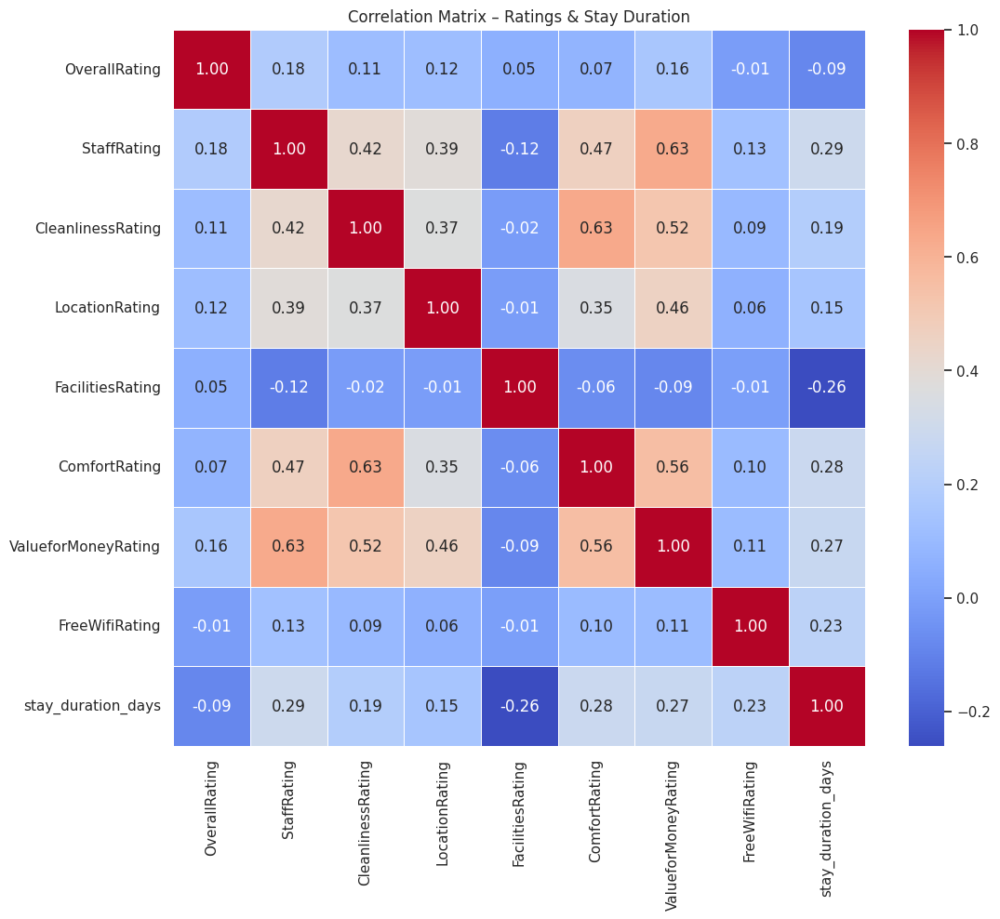

In [ ]:
corr_cols = rating_cols + ['stay_duration_days'] if 'stay_duration_days' in bad_df_en.columns else rating_cols
corr = bad_df_en[corr_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix – Ratings & Stay Duration')
plt.savefig('correlation_heatmap.png')
plt.show()

In [ ]:
all_text = ' '.join(bad_df_en['clean_text'])
word_counts = Counter(all_text.split())
top_50 = pd.DataFrame(word_counts.most_common(50), columns=['Word', 'Frequency'])

print("Top 50 most frequent words:\n")
display(top_50)

top_50.to_csv('top_50_words.csv', index=False)
files.download('top_50_words.csv')

Top 50 most frequent words:



,Word,Frequency
0,room,5560
1,hotel,5140
2,staff,2902
3,food,2378
4,good,2016
5,service,1910
6,one,1436
7,time,1418
8,pool,1348
9,night,1288


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
bigram_vec = CountVectorizer(ngram_range=(2,2), stop_words='english')
bigram_matrix = bigram_vec.fit_transform(bad_df_en['clean_text'])
bigram_sums = bigram_matrix.sum(axis=0).A1
bigrams = pd.DataFrame({
    'Bigram': bigram_vec.get_feature_names_out(),
    'Count': bigram_sums
}).sort_values('Count', ascending=False).head(20)

print("Top 20 bigrams:\n")
display(bigrams)

Top 20 bigrams:



,Bigram,Count
59733,sri lanka,450
11443,cinnamon hotel,230
59967,staff friendly,224
60663,star hotel,215
61366,stayed night,214
24067,food good,190
54027,room service,188
59734,sri lankan,186
62758,swimming pool,174
53453,room clean,164


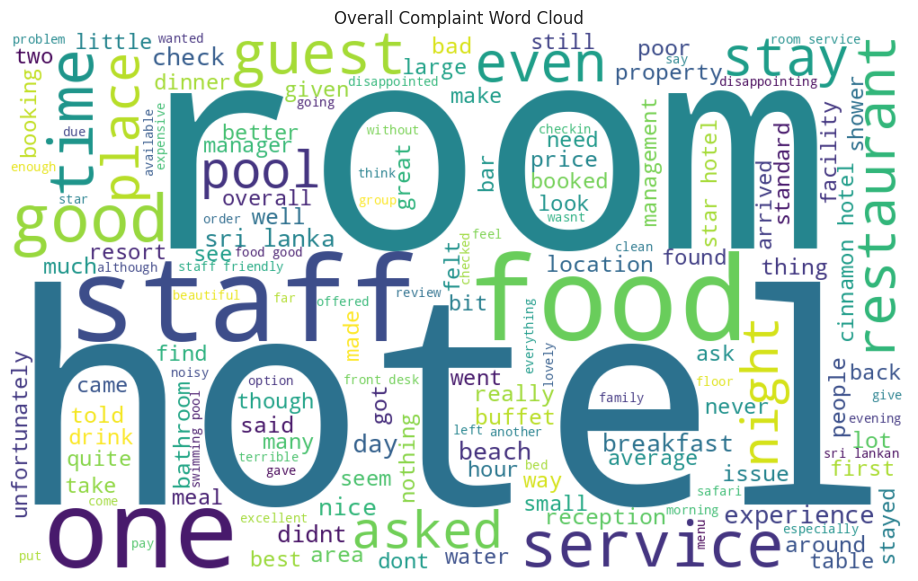

In [ ]:
wc = WordCloud(width=1000, height=600, background_color='white', max_words=150).generate(all_text)
plt.figure(figsize=(12, 7))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Overall Complaint Word Cloud')
plt.savefig('overall_wordcloud.png')
plt.show()

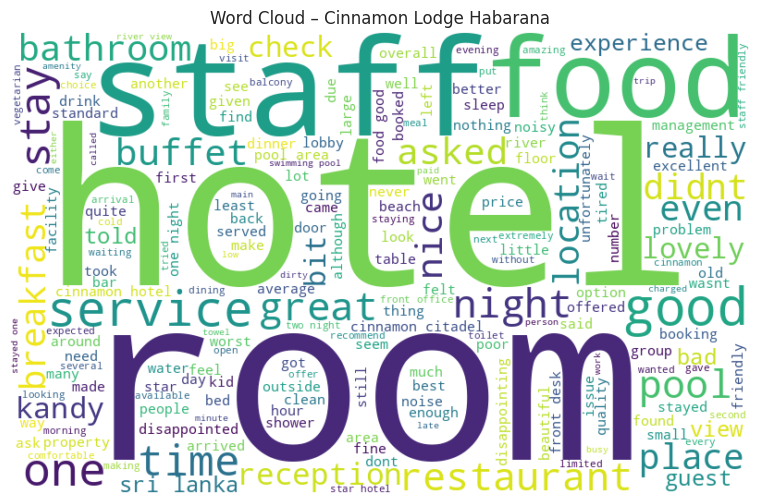

In [ ]:
top_hotel = bad_df_en['Hotel/Resort'].value_counts().index[0]
hotel_text = ' '.join(bad_df_en[bad_df_en['Hotel/Resort'] == top_hotel]['clean_text'])
wc_hotel = WordCloud(width=800, height=500, background_color='white').generate(hotel_text)

plt.figure(figsize=(10, 6))
plt.imshow(wc_hotel, interpolation='bilinear')
plt.axis('off')
plt.title(f'Word Cloud – {top_hotel}')
plt.savefig(f'wordcloud_{top_hotel.replace(" ", "_")}.png')
plt.show()

In [ ]:
hotel_traveler = pd.crosstab(bad_df_en['Hotel/Resort'], bad_df_en['TravlerType'], margins=True)
print("Hotel vs Traveler Type count:\n")
display(hotel_traveler)

Hotel vs Traveler Type count:



TravlerType,Couple,Family,Group,Nan,Solo Traveler,All
Hotel/Resort,,,,,,
Cinnamon Bey Beruwala,52,40,30,137,35,294
Cinnamon Citadel Kandy,11,27,4,190,0,232
Cinnamon Grand Colombo,17,19,1,111,2,150
Cinnamon Lakeside Colombo,11,29,5,58,3,106
Cinnamon Life Colombo,4,9,3,41,0,57
Cinnamon Lodge Habarana,15,26,12,253,1,307
Cinnamon Red Colombo,2,3,0,90,1,96
Cinnamon Wild Yala,13,23,4,100,3,143
Habarana Village by Cinnamon,16,23,10,13,13,75


In [ ]:
country_hotel = pd.crosstab(bad_df_en['Country'], bad_df_en['Hotel/Resort'], normalize='index').round(3)
print("Country vs Hotel (row-normalized):\n")
display(country_hotel.head(10))

Country vs Hotel (row-normalized):



Hotel/Resort,Cinnamon Bey Beruwala,Cinnamon Citadel Kandy,Cinnamon Grand Colombo,Cinnamon Lakeside Colombo,Cinnamon Life Colombo,Cinnamon Lodge Habarana,Cinnamon Red Colombo,Cinnamon Wild Yala,Habarana Village by Cinnamon,Hikka Tranz by Cinnamon,Kandy Mist by Cinnamon,Trinco Blu by Cinnamon
Country,,,,,,,,,,,,
AARTSELAAR,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,1.00
ABU DHABI,0.25,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.25,0.0,0.25
ADELAIDE,0.00,0.0,0.0,0.0,0.0,1.00,0.0,0.0,0.0,0.00,0.0,0.00
AHMEDABAD,0.00,1.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00
AKYAKA,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,1.00
AL KHOBAR,0.00,0.0,0.0,0.0,0.0,1.00,0.0,0.0,0.0,0.00,0.0,0.00
ALAPPUZHA,0.00,0.0,0.0,0.0,0.0,1.00,0.0,0.0,0.0,0.00,0.0,0.00
ALBUQUERQUE,0.00,1.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00
ALDERSHOT,0.00,0.0,0.0,0.0,0.0,1.00,0.0,0.0,0.0,0.00,0.0,0.00


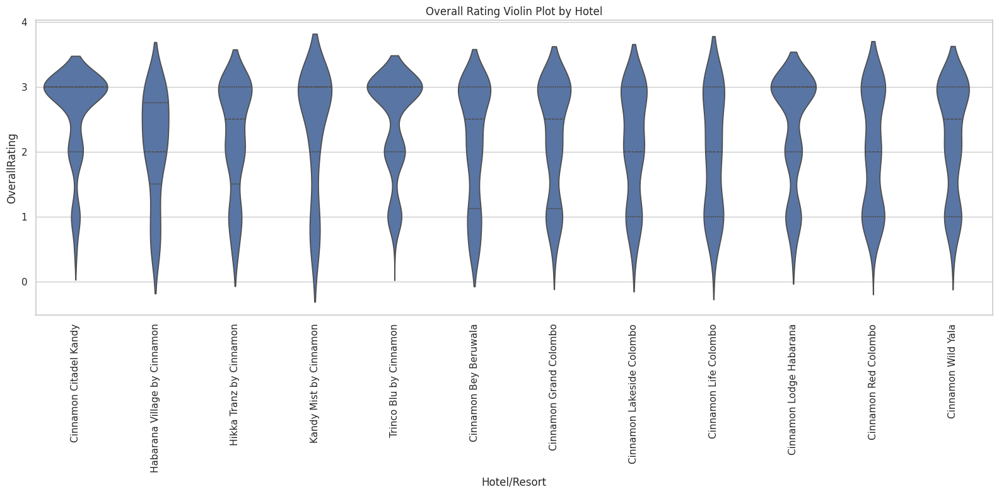

In [ ]:
plt.figure(figsize=(16, 8))
sns.violinplot(x='Hotel/Resort', y='OverallRating', data=bad_df_en, inner='quartile')
plt.xticks(rotation=90)
plt.title('Overall Rating Violin Plot by Hotel')
plt.tight_layout()
plt.savefig('violin_hotel_rating.png')
plt.show()

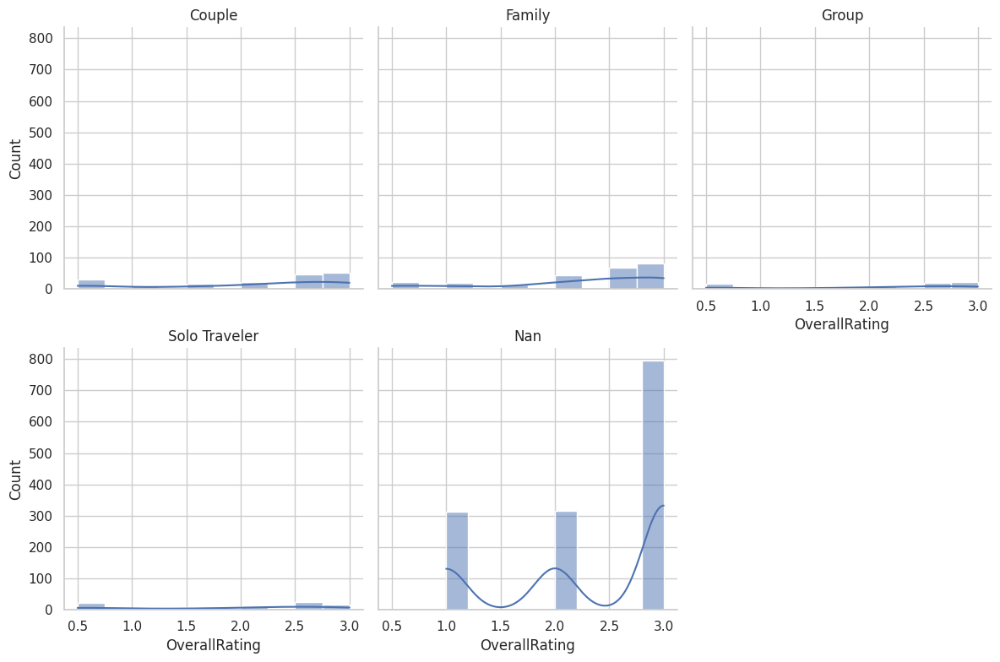

In [ ]:
g = sns.FacetGrid(bad_df_en, col='TravlerType', col_wrap=3, height=4)
g.map(sns.histplot, 'OverallRating', bins=10, kde=True)
g.set_titles('{col_name}')
plt.savefig('facet_traveler_hist.png')
plt.show()

In [ ]:
print("EDA Completed – Key Findings:")
print(f"• Total English bad reviews: {len(bad_df_en)}")
print(f"• Most reviewed hotel: {bad_df_en['Hotel/Resort'].value_counts().index[0]}")
print(f"• Dominant country: {bad_df_en['Country'].value_counts().index[0]}")
print(f"• Average Overall Rating: {bad_df_en['OverallRating'].mean():.2f}")
print("→ All plots saved as PNG files.")
print("→ Ready for Section 4: Sentiment & Topic Modeling")

EDA Completed – Key Findings:
• Total English bad reviews: 2022
• Most reviewed hotel: Cinnamon Lodge Habarana
• Dominant country: NAN
• Average Overall Rating: 2.26
→ All plots saved as PNG files.
→ Ready for Section 4: Sentiment & Topic Modeling


### 4. Sentiment Analysis

In [ ]:
!pip install vaderSentiment textblob -q
print("Sentiment libraries installed.")

Sentiment libraries installed.


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

analyzer = SentimentIntensityAnalyzer()

def get_vader(text):
    scores = analyzer.polarity_scores(text)
    return scores['compound'], scores['pos'], scores['neg'], scores['neu']

bad_df_en[['vader_compound', 'vader_pos', 'vader_neg', 'vader_neu']] = bad_df_en['clean_text'].apply(lambda x: pd.Series(get_vader(x)))

bad_df_en['textblob_polarity'] = bad_df_en['clean_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
bad_df_en['textblob_subjectivity'] = bad_df_en['clean_text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

print("Sentiment stats:\n", bad_df_en[['vader_compound', 'textblob_polarity']].describe().round(2))
display(bad_df_en[['clean_text', 'vader_compound', 'textblob_polarity']].head(10))

Sentiment stats:
        vader_compound  textblob_polarity
count         2022.00            2022.00
mean             0.40               0.11
std              0.73               0.24
min             -1.00              -1.00
25%             -0.12              -0.01
50%              0.84               0.11
75%              0.98               0.25
max              1.00               1.00


,clean_text,vader_compound,textblob_polarity
0,thing different room provided reception bad pr...,-0.7906,-0.200000
1,big beautiful general everything room mosquito...,0.9879,0.169841
2,relaxed room setup garden view reclined chair ...,0.8860,-0.071429
3,decently large water retention floor super ann...,0.9608,-0.210476
4,property huge buffet spread nice location supe...,0.9607,0.212465
5,staff genuinely wonderful reception bar restau...,0.9930,0.167436
6,location ambience good food best expected fly ...,0.9371,0.350000
7,location breakfast great staff friendly helpfu...,0.8957,-0.059091
8,room cleanness found live cockroach making odd...,0.1531,0.117424
9,friendly staff delusion room looking rundown n...,0.9001,0.178333


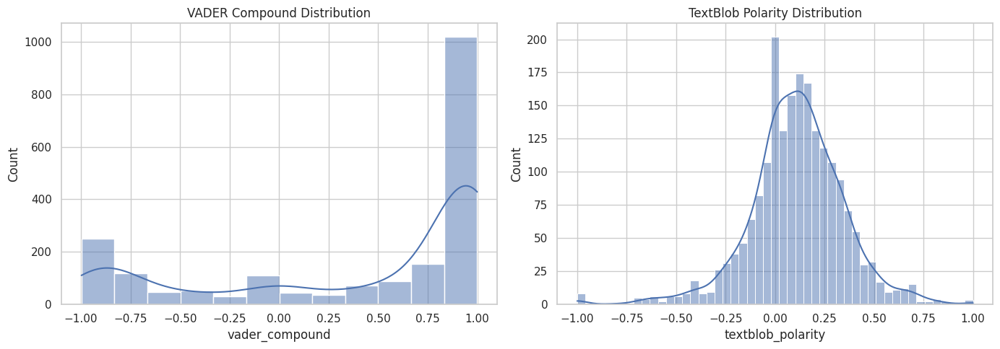

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.histplot(bad_df_en['vader_compound'], kde=True, ax=axes[0])
axes[0].set_title('VADER Compound Distribution')
sns.histplot(bad_df_en['textblob_polarity'], kde=True, ax=axes[1])
axes[1].set_title('TextBlob Polarity Distribution')
plt.tight_layout()
plt.savefig('sentiment_distributions.png')
plt.show()

Hotel sentiment details (sorted by worst VADER):



,vader_mean,vader_std,vader_count,textblob_mean,textblob_std,textblob_count
Hotel/Resort,,,,,,
Habarana Village by Cinnamon,0.09,0.68,75,0.07,0.22,75
Cinnamon Life Colombo,0.17,0.82,57,0.06,0.23,57
Cinnamon Red Colombo,0.24,0.76,96,0.05,0.25,96
Cinnamon Bey Beruwala,0.33,0.71,294,0.10,0.30,294
Hikka Tranz by Cinnamon,0.34,0.75,212,0.07,0.25,212
Cinnamon Lakeside Colombo,0.35,0.68,106,0.12,0.24,106
Cinnamon Grand Colombo,0.36,0.74,150,0.08,0.26,150
Cinnamon Wild Yala,0.37,0.77,143,0.10,0.25,143
Cinnamon Lodge Habarana,0.43,0.73,307,0.12,0.20,307


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

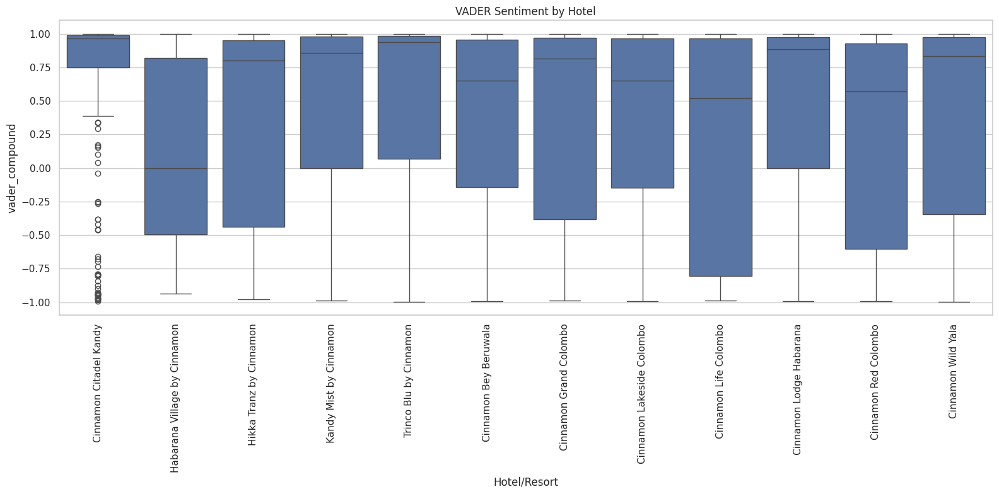

In [ ]:
# Segmentation by Hotel – Sentiment Means & Boxplots
hotel_sent = bad_df_en.groupby('Hotel/Resort')[['vader_compound', 'textblob_polarity']].agg(['mean', 'std', 'count']).round(2)

# Flatten columns for easier reading/sorting
hotel_sent.columns = ['vader_mean', 'vader_std', 'vader_count',
                      'textblob_mean', 'textblob_std', 'textblob_count']

# Sort by worst (most negative) VADER mean
hotel_sent = hotel_sent.sort_values('vader_mean')

print("Hotel sentiment details (sorted by worst VADER):\n")
display(hotel_sent)

hotel_sent.to_csv('hotel_sentiment.csv', index=True)
files.download('hotel_sentiment.csv')

# Boxplot remains the same
plt.figure(figsize=(16, 8))
sns.boxplot(x='Hotel/Resort', y='vader_compound', data=bad_df_en)
plt.xticks(rotation=90)
plt.title('VADER Sentiment by Hotel')
plt.tight_layout()
plt.savefig('boxplot_hotel_sentiment.png')
plt.show()

In [ ]:
# Segmentation by Country – Sentiment Mean & Count
country_sent = bad_df_en.groupby('Country')[['vader_compound']].agg(['mean', 'count']).round(2)

# Flatten column names so sorting works easily
country_sent.columns = ['vader_mean', 'review_count']

# Sort by mean sentiment (ascending = most negative first)
country_sent = country_sent.sort_values('vader_mean')

print("Country sentiment (sorted by mean VADER):\n")
display(country_sent.head(15))

# Save for report/poster
country_sent.to_csv('country_sentiment.csv')
files.download('country_sentiment.csv')

Country sentiment (sorted by mean VADER):



,vader_mean,review_count
Country,,
CHATSWOOD,-0.98,1
WARSAW,-0.98,1
MITSPE RAMON,-0.97,1
WORLD,-0.97,1
ANN ARBOR,-0.97,1
CAPE TOWN CENTRAL,-0.96,1
HASTINGS,-0.95,1
INDIA,-0.95,1
WILLIAMSTOWN,-0.94,1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

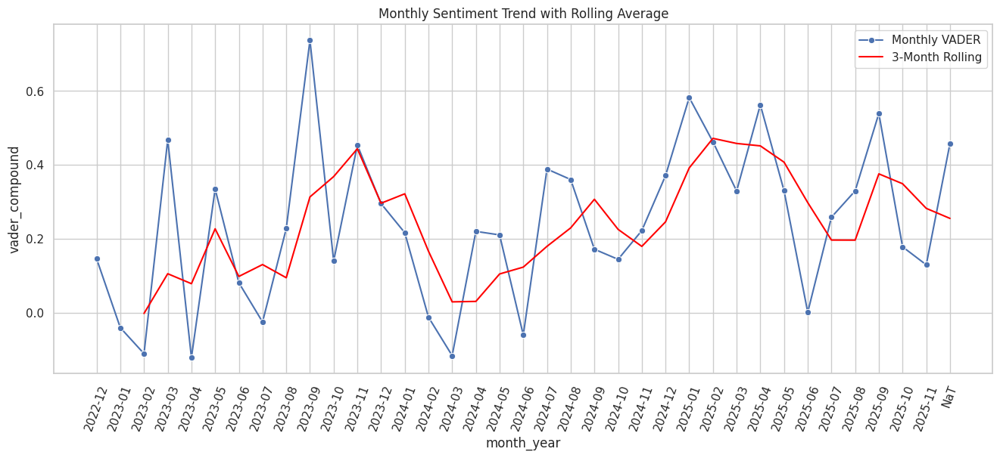

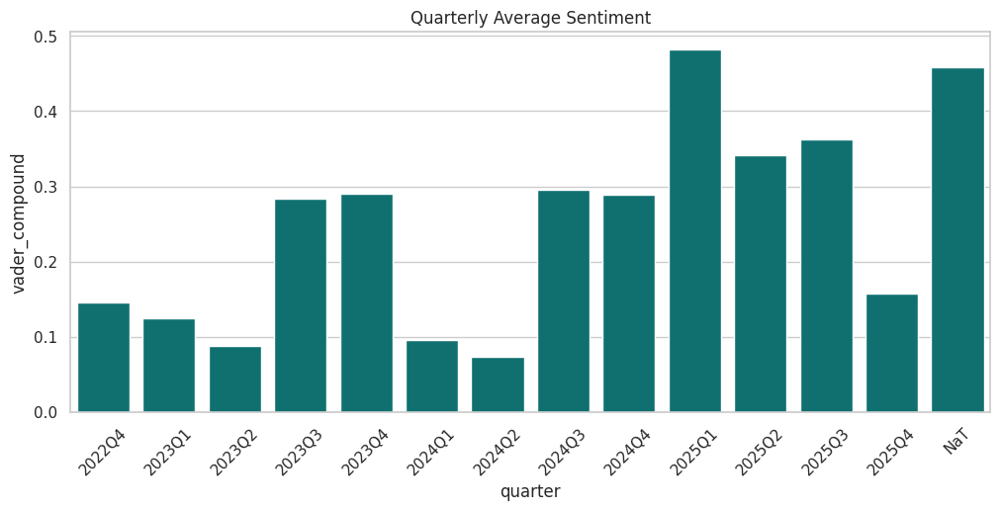

In [ ]:
monthly_sent = bad_df_en.groupby('month_year')[['vader_compound', 'textblob_polarity']].mean().reset_index()
monthly_sent['rolling_mean_vader'] = monthly_sent['vader_compound'].rolling(window=3).mean()

plt.figure(figsize=(16, 6))
sns.lineplot(x='month_year', y='vader_compound', data=monthly_sent, marker='o', label='Monthly VADER')
sns.lineplot(x='month_year', y='rolling_mean_vader', data=monthly_sent, color='red', label='3-Month Rolling')
plt.title('Monthly Sentiment Trend with Rolling Average')
plt.xticks(rotation=70)
plt.legend()
plt.savefig('monthly_sentiment_rolling.png')
plt.show()

quarter_sent = bad_df_en.groupby('quarter')[['vader_compound']].mean().reset_index()
plt.figure(figsize=(12, 5))
sns.barplot(x='quarter', y='vader_compound', data=quarter_sent, color='teal')
plt.title('Quarterly Average Sentiment')
plt.xticks(rotation=45)
plt.savefig('quarterly_sentiment_bar.png')
plt.show()

In [ ]:
from scipy.stats import ttest_ind, mannwhitneyu

# Example split: Pre-2023 vs Post (adjust year if data range different)
pre = bad_df_en[bad_df_en['year'] < 2023]['vader_compound']
post = bad_df_en[bad_df_en['year'] >= 2023]['vader_compound']
t_stat, p_val = ttest_ind(pre, post)
print("T-test pre/post 2023: t={:.2f}, p={:.4f}".format(t_stat, p_val))

mw_stat, mw_p = mannwhitneyu(pre, post)
print("Mann-Whitney U: stat={:.2f}, p={:.4f}".format(mw_stat, mw_p))

T-test pre/post 2023: t=-0.46, p=0.6453
Mann-Whitney U: stat=1859.00, p=0.6454


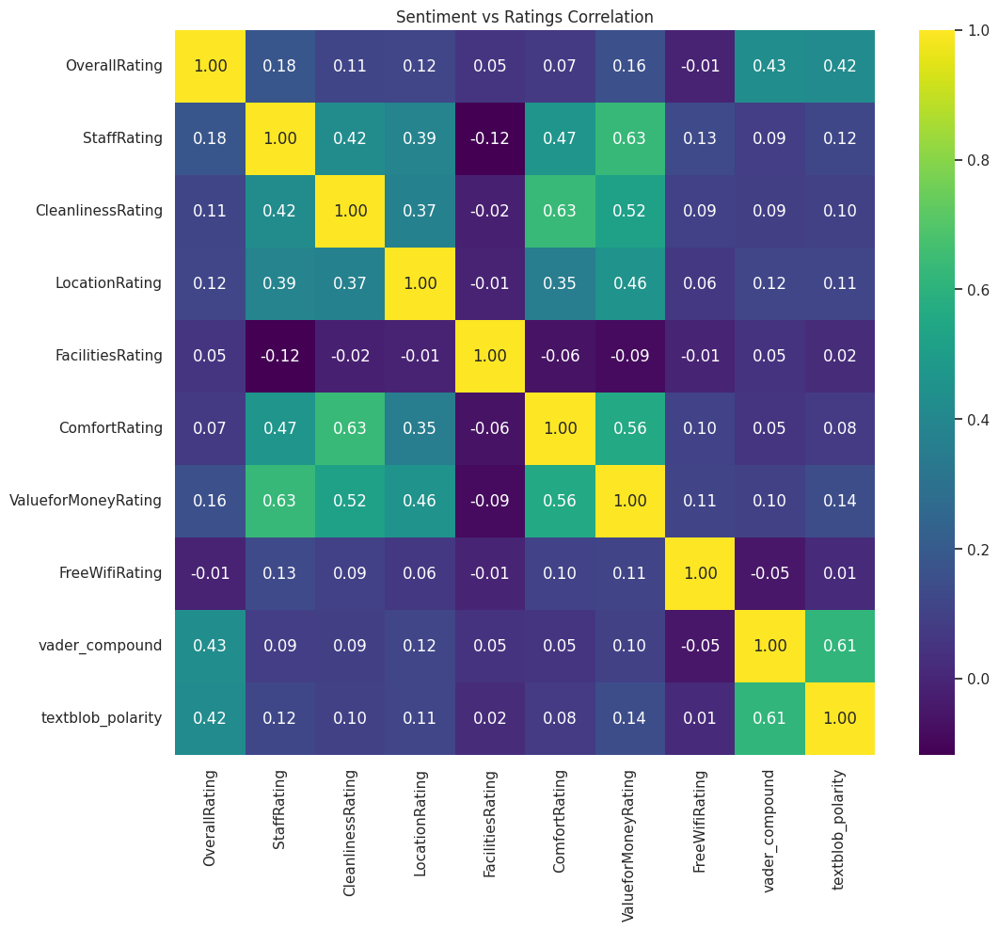

In [ ]:
corr_sent_rating = bad_df_en[rating_cols + ['vader_compound', 'textblob_polarity']].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_sent_rating, annot=True, cmap='viridis', fmt='.2f')
plt.title('Sentiment vs Ratings Correlation')
plt.savefig('sent_rating_corr.png')
plt.show()

### 5. Topic Modeling & Clustering

In [ ]:
!pip install gensim pyLDAvis sentence-transformers -q
print("All topic modeling & clustering packages installed.")

All topic modeling & clustering packages installed.


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
import pyLDAvis
import pyLDAvis.lda_model  # Correct modern import
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
print("Topic modeling & visualization libraries imported.")

Topic modeling & visualization libraries imported.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
tfidf_vec = TfidfVectorizer(
    max_df=0.85,          # ignore very common words
    min_df=5,             # ignore very rare words
    ngram_range=(1,2),    # include bigrams
    stop_words='english'
)

tfidf_dtm = tfidf_vec.fit_transform(bad_df_en['clean_text'])
feature_names = tfidf_vec.get_feature_names_out()

print("TF-IDF matrix shape:", tfidf_dtm.shape)
print("Number of terms:", len(feature_names))
print("Sample terms (first 10):", feature_names[:10])
print("Sample terms (last 10):", feature_names[-10:])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

TF-IDF matrix shape: (2022, 3910)
Number of terms: 3910
Sample terms (first 10): ['_xd_' '_xd_ _xd_' 'ability' 'able' 'absolute' 'absolutely' 'accept'
 'acceptable' 'accepted' 'access']
Sample terms (last 10): ['yesterday' 'youd' 'youd expect' 'youll' 'young' 'young kid' 'youre'
 'youre looking' 'youve' 'zero']


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
# Tokenized texts for coherence calculation
texts = bad_df_en['clean_text'].str.split().tolist()

# Gensim dictionary
dictionary = Dictionary(texts)

# Bag-of-words corpus
corpus = [dictionary.doc2bow(text) for text in texts]

print("Gensim dictionary created – size:", len(dictionary))
print("Corpus created – number of documents:", len(corpus))

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Gensim dictionary created – size: 9181
Corpus created – number of documents: 2022


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
coherence_scores = []
k_values = range(3, 13)  # Test 3 to 12 topics

print("Starting LDA topic number tuning (may take a few minutes)...")

Starting LDA topic number tuning (may take a few minutes)...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
for k in k_values:
    lda_tune = LatentDirichletAllocation(
        n_components=k,
        random_state=42,
        learning_method='online'
    )
    lda_tune.fit(tfidf_dtm)

    # Extract top words for each topic
    topics = []
    for comp in lda_tune.components_:
        top_idx = comp.argsort()[-10:][::-1]
        top_words = [feature_names[i] for i in top_idx]
        topics.append(top_words)

    # Compute coherence
    coh_model = CoherenceModel(
        topics=topics,
        texts=texts,
        dictionary=dictionary,
        coherence='c_v'
    )
    score = coh_model.get_coherence()
    coherence_scores.append(score)

    print(f"→ {k} topics: Coherence = {score:.4f}")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 3 topics: Coherence = 0.3255


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 4 topics: Coherence = 0.3157


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 5 topics: Coherence = 0.3232


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 6 topics: Coherence = 0.3313


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 7 topics: Coherence = 0.3687


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 8 topics: Coherence = 0.3189


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 9 topics: Coherence = 0.3492


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 10 topics: Coherence = 0.3363


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 11 topics: Coherence = 0.3667


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

→ 12 topics: Coherence = 0.3832


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
best_idx = np.argmax(coherence_scores)
best_k = k_values[best_idx]
best_coherence = coherence_scores[best_idx]

print("\nCoherence Results Summary:")
for k, score in zip(k_values, coherence_scores):
    print(f"  {k} topics → {score:.4f}")

print(f"\nBest number of topics: {best_k} (coherence = {best_coherence:.4f})")


Coherence Results Summary:
  3 topics → 0.3255
  4 topics → 0.3157
  5 topics → 0.3232
  6 topics → 0.3313
  7 topics → 0.3687
  8 topics → 0.3189
  9 topics → 0.3492
  10 topics → 0.3363
  11 topics → 0.3667
  12 topics → 0.3832

Best number of topics: 12 (coherence = 0.3832)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
lda = LatentDirichletAllocation(
    n_components=best_k,
    random_state=42,
    learning_method='online',
    max_iter=20
)

lda.fit(tfidf_dtm)
print(f"Final LDA model trained with {best_k} topics.")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Final LDA model trained with 12 topics.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
topic_distribution = lda.transform(tfidf_dtm)
bad_df_en['lda_topic'] = topic_distribution.argmax(axis=1)
bad_df_en['lda_topic_prob'] = topic_distribution.max(axis=1)  # confidence score

print("Topics assigned to reviews.")
print("\nTopic distribution (percentage of reviews):\n")
display(bad_df_en['lda_topic'].value_counts(normalize=True).round(3) * 100)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Topics assigned to reviews.

Topic distribution (percentage of reviews):



/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,proportion
lda_topic,
0,99.3
1,0.5
2,0.0
3,0.0
8,0.0
7,0.0


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
print("Top 15 words for each topic:")
for topic_id in range(best_k):
    top_idx = lda.components_[topic_id].argsort()[-15:][::-1]
    top_words = [feature_names[i] for i in top_idx]
    print(f"Topic {topic_id}: {' '.join(top_words)}")

Top 15 words for each topic:
Topic 0: room hotel staff food good service pool time location night stay restaurant nice buffet breakfast
Topic 1: location staff location musty smell non smoking staff service checking process sound proof terrible food musty pathetic staff service location service responsive smell room
Topic 2: scam car room view room view location breakfast car park park hotel hotel comfortable good staff need cleanliness
Topic 3: profile displayed room furniture pic furniture room poor service location poor service dinning usd service poor old breakfast
Topic 4: noisy room size disrespectful russian music size breakfast airconditioning room comfortable high wedding tired location change didnt like
Topic 5: switch room twice crawling room food switch check charge ant lot portion minute lift room carry lift
Topic 6: room bed sofa uncomfortable bed poor condition room double charged good bed uncomfortable breakfast good double bed advertised staff make feel
Topic 7: food f

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
pyLDAvis.enable_notebook()

vis = pyLDAvis.lda_model.prepare(
    lda,
    tfidf_dtm,
    tfidf_vec,
    mds='tsne',        # or 'mmds' if tsne is slow
    n_jobs=-1
)

# Show interactive plot in notebook
pyLDAvis.display(vis)

# Save as HTML file for your report/poster
pyLDAvis.save_html(vis, 'lda_interactive_visual.html')
files.download('lda_interactive_visual.html')

print("Interactive LDA topic map created and downloaded.")
print("→ Open 'lda_interactive_visual.html' in browser to explore topic relationships.")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

<IPython.core.display.Javascript object>

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<IPython.core.display.Javascript object>

Interactive LDA topic map created and downloaded.
→ Open 'lda_interactive_visual.html' in browser to explore topic relationships.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

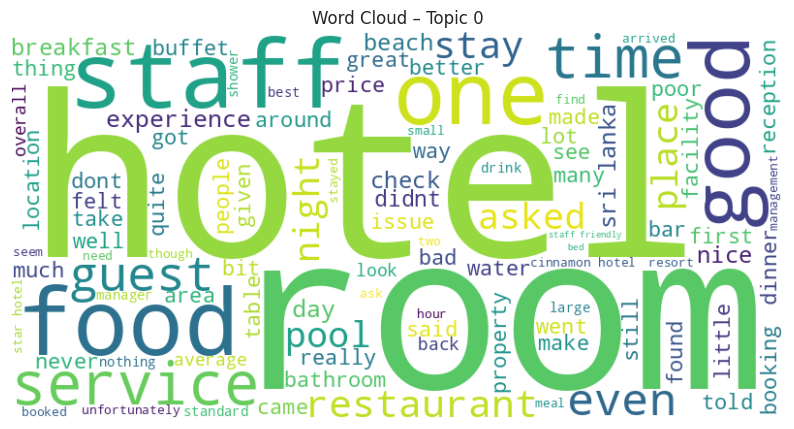

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

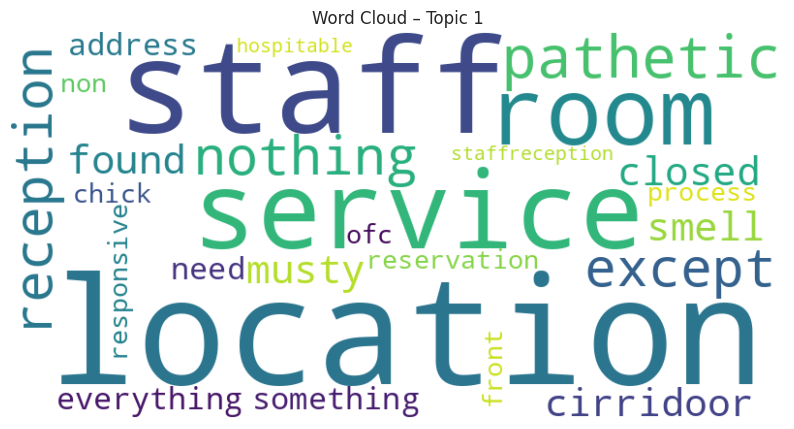

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

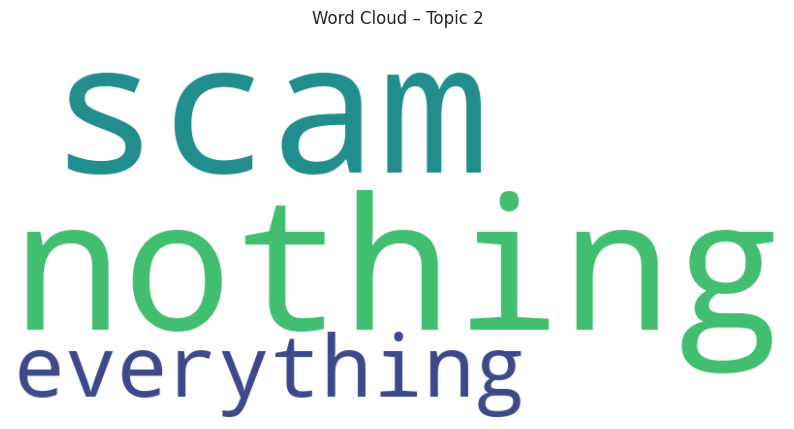

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

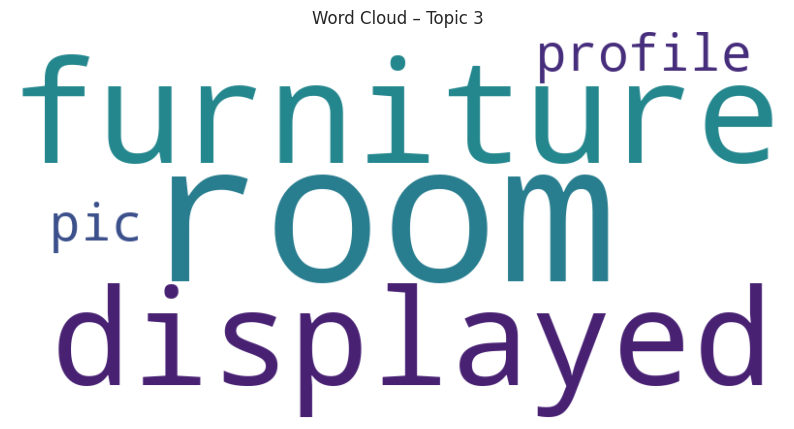

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Topic 4: No text available
Topic 5: No text available
Topic 6: No text available


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

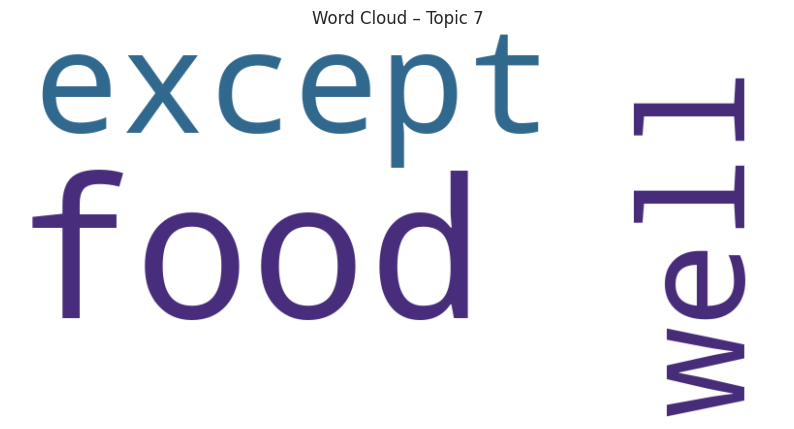

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

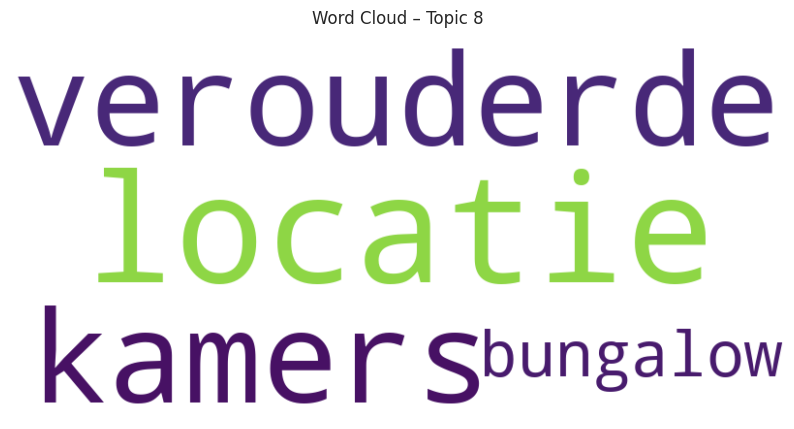

Topic 9: No text available
Topic 10: No text available
Topic 11: No text available


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
for topic_id in range(best_k):
    # Get text from reviews assigned to this topic
    topic_reviews = bad_df_en[bad_df_en['lda_topic'] == topic_id]['clean_text']
    topic_text = ' '.join(topic_reviews)

    if len(topic_text.strip()) == 0:
        print(f"Topic {topic_id}: No text available")
        continue

    wc = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(topic_text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud – Topic {topic_id}')
    plt.savefig(f'topic_{topic_id}_wordcloud.png')
    plt.show()

In [ ]:
from sentence_transformers import SentenceTransformer

print("Loading Sentence-BERT model...")
model = SentenceTransformer('all-MiniLM-L6-v2')  # fast and good quality

embeddings = model.encode(
    bad_df_en['clean_text'].tolist(),
    show_progress_bar=True,
    batch_size=64
)

print("BERT embeddings generated. Shape:", embeddings.shape)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Loading Sentence-BERT model...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

BERT embeddings generated. Shape: (2022, 384)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
sil_scores = []
k_range = range(3, 11)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(embeddings)
    sil = silhouette_score(embeddings, labels)
    sil_scores.append(sil)
    print(f"Clusters = {k} → Silhouette = {sil:.4f}")

best_k_bert = k_range[np.argmax(sil_scores)]
print(f"\nBest number of BERT clusters: {best_k_bert}")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 3 → Silhouette = 0.0285


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 4 → Silhouette = 0.0266


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 5 → Silhouette = 0.0260


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 6 → Silhouette = 0.0282


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 7 → Silhouette = 0.0217


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 8 → Silhouette = 0.0235


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 9 → Silhouette = 0.0247


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Clusters = 10 → Silhouette = 0.0140

Best number of BERT clusters: 3


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
kmeans_bert = KMeans(n_clusters=best_k_bert, random_state=42, n_init=10)
bad_df_en['bert_cluster'] = kmeans_bert.fit_predict(embeddings)

print("BERT clusters assigned.")
print("\nCluster distribution:\n")
display(bad_df_en['bert_cluster'].value_counts(normalize=True).round(3) * 100)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

BERT clusters assigned.

Cluster distribution:



/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

,proportion
bert_cluster,
2,40.4
0,34.9
1,24.7


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
for cluster_id in range(best_k_bert):
    cluster_reviews = bad_df_en[bad_df_en['bert_cluster'] == cluster_id]['clean_text'].sample(5, random_state=42)
    print(f"\nBERT Cluster {cluster_id} – 5 sample reviews:")
    for i, text in enumerate(cluster_reviews, 1):
        print(f"  {i}. {text[:120]}...")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag


BERT Cluster 0 – 5 sample reviews:
  1. charged usd extra bed room cost usd booking done agoda checked agoda said hotel charged hotel told agoda agent charged f...
  2. big spacious room natural surroundings place old worn place old worn big spacious room natural surroundings...
  3. room comfortable noisy party late keycard working never replaced despite going thé desk change noisy party late keycard ...
  4. room shown booking allocated room shown booking allocated...
  5. room safe staying _xd_ showe room open roof _xd_ saw insect inside _xd_ health safety important_xd_ comport need improve...

BERT Cluster 1 – 5 sample reviews:
  1. mixed review really complex self isnt bad set large area land small little suite laid like village near lake wildlife qu...
  2. first star hotel worst hotel ive stayed sri lanka accommodation first room ive got moldy one smell room awful complained...
  3. booked hotel location visiting friend live nearby got good offer price hotel good location turtl

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

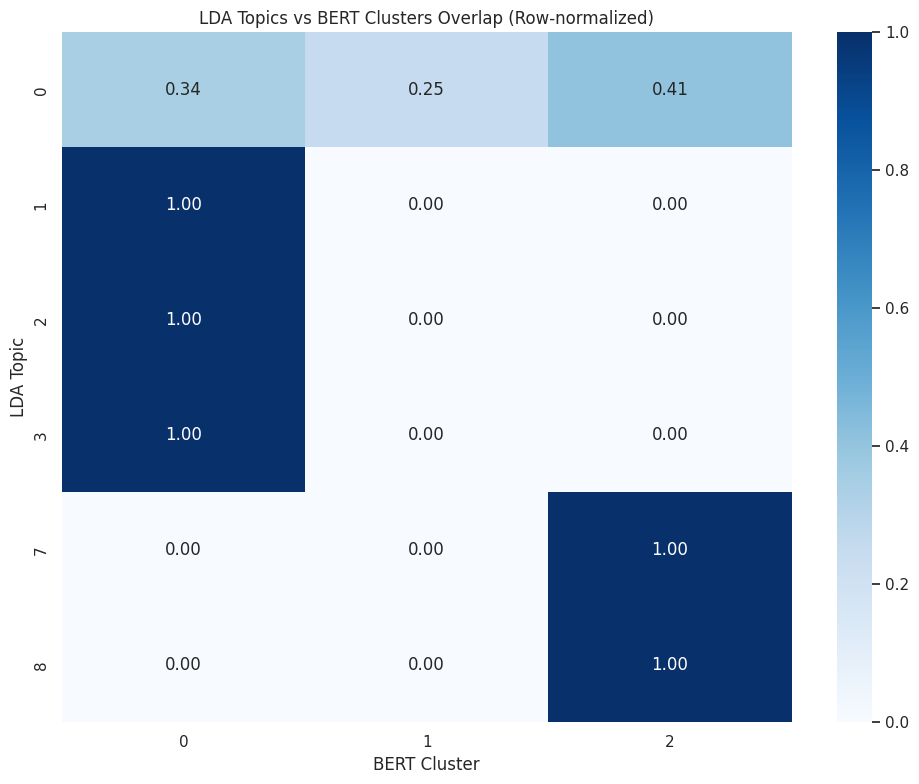

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
cross_table = pd.crosstab(
    bad_df_en['lda_topic'],
    bad_df_en['bert_cluster'],
    normalize='index'
).round(2)

plt.figure(figsize=(10, 8))
sns.heatmap(cross_table, annot=True, cmap='Blues', fmt='.2f')
plt.title('LDA Topics vs BERT Clusters Overlap (Row-normalized)')
plt.xlabel('BERT Cluster')
plt.ylabel('LDA Topic')
plt.tight_layout()
plt.savefig('lda_vs_bert_overlap.png')
plt.show()

### 6. Advanced NLP Enhancements


In [ ]:
!pip install spacy -q
!python -m spacy download en_core_web_sm -q
print("spaCy and English model installed.")

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

     ━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━ 7.2/12.8 MB 64.0 MB/s eta 0:00:01

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 50.4 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

spaCy and English model installed.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
import spacy
from collections import Counter

nlp = spacy.load('en_core_web_sm')
print("spaCy model loaded successfully.")

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

spaCy model loaded successfully.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
def extract_entities(text):
    """
    Extract named entities (people, organizations, locations, products, nationalities).
    Returns list of tuples: (entity_text, entity_label)
    """
    if not text.strip():
        return []
    doc = nlp(text)
    return [(ent.text, ent.label_) for ent in doc.ents
            if ent.label_ in ['PERSON', 'ORG', 'GPE', 'PRODUCT', 'NORP', 'FAC']]

print("NER extraction function defined.")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

NER extraction function defined.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
print("Running NER on cleaned reviews... (may take a minute)")
bad_df_en['ner_entities'] = bad_df_en['clean_text'].apply(extract_entities)

print("NER complete.")
print("Number of reviews with entities:", (bad_df_en['ner_entities'].str.len() > 0).sum())

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Running NER on cleaned reviews... (may take a minute)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

NER complete.
Number of reviews with entities: 704


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
all_entities = [ent[0] for row in bad_df_en['ner_entities'] for ent in row]
entity_freq = Counter(all_entities).most_common(30)

print("Top 30 named entities mentioned in reviews:\n")
entity_df = pd.DataFrame(entity_freq, columns=['Entity', 'Count'])
display(entity_df.head(20))

entity_df.to_csv('top_entities.csv', index=False)
files.download('top_entities.csv')

In [ ]:
print("Sample reviews with extracted entities:")
for idx, row in bad_df_en[bad_df_en['ner_entities'].str.len() > 0].sample(5, random_state=42).iterrows():
    print(f"\nReview snippet: {row['clean_text'][:150]}...")
    print("Entities:", row['ner_entities'])

In [ ]:
aspects_keywords = {
    'staff': ['staff', 'service', 'reception', 'manager', 'waiter', 'friendly', 'attitude', 'rude'],
    'room': ['room', 'bed', 'bathroom', 'view', 'balcony', 'clean', 'dirty', 'smell'],
    'food': ['food', 'buffet', 'restaurant', 'breakfast', 'dinner', 'meal', 'taste'],
    'location': ['location', 'beach', 'pool', 'area', 'city', 'close', 'far'],
    'value': ['price', 'value', 'money', 'expensive', 'worth', 'cost', 'cheap'],
    'facilities': ['wifi', 'gym', 'spa', 'facilities', 'amenities', 'bar', 'parking']
}

print("Aspect categories defined with keywords.")

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

def get_aspect_sentiment(text):
    scores = {}
    text_lower = text.lower()
    for aspect, keywords in aspects_keywords.items():
        # Find sentences/words containing any keyword
        matched_words = [w for w in text_lower.split() if any(k in w for k in keywords)]
        if matched_words:
            aspect_text = ' '.join(matched_words)
            scores[aspect] = analyzer.polarity_scores(aspect_text)['compound']
    return scores

print("Aspect-based sentiment function ready.")

In [ ]:
print("Calculating aspect-level sentiment... (may take a minute)")
bad_df_en['aspect_scores'] = bad_df_en['clean_text'].apply(get_aspect_sentiment)

print("Aspect sentiment added.")
print("\nExample aspect scores (first 5 rows):\n")
display(bad_df_en['aspect_scores'].head(8))

In [ ]:
# Convert list of dicts to DataFrame
aspect_df = pd.DataFrame(bad_df_en['aspect_scores'].tolist())
aspect_means = aspect_df.mean().round(2).to_frame(name='Average Sentiment')

print("Average sentiment score per aspect:\n")
display(aspect_means.sort_values('Average Sentiment'))

aspect_means.to_csv('aspect_average_sentiment.csv')
files.download('aspect_average_sentiment.csv')

In [ ]:
# Explode aspect scores into columns
aspect_expanded = pd.concat([bad_df_en[['Hotel/Resort']], aspect_df], axis=1)
hotel_aspect_mean = aspect_expanded.groupby('Hotel/Resort').mean().round(2)

print("Average aspect sentiment by hotel:\n")
display(hotel_aspect_mean.sort_values('staff', ascending=True).head(10))  # worst staff first

hotel_aspect_mean.to_csv('hotel_aspect_sentiment.csv')
files.download('hotel_aspect_sentiment.csv')

In [ ]:
print("Top keywords per keyword cluster:")
for cluster_id in sorted(bad_df_en['keyword_cluster'].unique()):
    cluster_mask = bad_df_en['keyword_cluster'] == cluster_id
    cluster_dtm = key_dtm[cluster_mask]
    if cluster_dtm.shape[0] == 0:
        continue
    mean_scores = cluster_dtm.mean(axis=0).A1
    top_idx = mean_scores.argsort()[-12:][::-1]
    top_words = [key_vec.get_feature_names_out()[i] for i in top_idx]
    print(f"Cluster {cluster_id} ({cluster_mask.sum()} reviews): {' '.join(top_words)}")

In [ ]:
# Combine aspects + ratings
aspect_rating_df = pd.concat([
    bad_df_en[rating_cols + ['OverallRating']],
    aspect_df
], axis=1)

# Correlation matrix
corr_matrix = aspect_rating_df.corr().round(2)

print("Aspect sentiment vs ratings correlation:\n")
display(corr_matrix.loc[list(aspects_keywords.keys()), rating_cols + ['OverallRating']])

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(
    corr_matrix.loc[list(aspects_keywords.keys()), rating_cols + ['OverallRating']],
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1,
    fmt='.2f'
)
plt.title('Aspect Sentiment vs Rating Categories Correlation')
plt.tight_layout()
plt.savefig('aspect_rating_correlation_heatmap.png')
plt.show()

In [ ]:
bad_df_en.to_csv('reviews_advanced_nlp_final.csv', index=False)
files.download('reviews_advanced_nlp_final.csv')

print("Advanced NLP features (NER, aspects, clusters) exported.")
print("File name: reviews_advanced_nlp_final.csv")
print("→ Ready for monthly playbook generation (Section 7).")